In [1]:
using TensorGraphicalModels
using TensorToolbox
using Plots
using MIRTjim: jim
using SparseArrays
using LinearAlgebra
using Distributions
using Random
using StatsBase

In [9]:
model_type = "ks"
sub_model_type = "ar1" #this defines the structure of the Kronecker factors, sb = star-block
K = 2
N = 1000
d_list = [50, 50]
d = prod(d_list)
λ_var = [1.0729830131446736,1.0729830131446736]
lambda_test = [1.01,1.01]

X,psi0_list= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list,a_corr =0.3) #multi-dimensional array (tensor) of dimension d_1 × … × d_K × N
Ψ_hat_list_kg= kglasso(X);


(2,)

In [28]:
model_type = "ks"
sub_model_type = "ar1" #this defines the structure of the Kronecker factors, sb = star-block
K = 2
N = 1000
d_list = [50, 50]
# X_wed, psi0_wed= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr = 0.2,Ψ_list =psi0_kg )
# X_wed, psi0_wed= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr = 0.3 )
l = 0.175
Ψ_hat_list_wed= kglasso(X,λ_list = [l,l]);

omega_kg = kron(Ψ_hat_list_kg[1], Ψ_hat_list_kg[2]); #Kglasso
omega_wd = kron(Ψ_hat_list_wed[1], Ψ_hat_list_wed[2]); #WedTLasso
omega_gt = kron(psi0_list[1], psi0_list[2]); #groundtrth

mcc1 = TensorGraphicalModels.metric_edge(omega_gt,omega_kg)
mcc2 = TensorGraphicalModels.metric_edge(omega_gt,omega_wd)
print(mcc1,mcc2)

[0.0, 9702.0, 0.0, 3.114048e6, 0.0, 1.0, NaN, 0.0, NaN][0.0, 7302.0, 2400.0, 3.114048e6, 0.0, 0.7526283240568955, 1.0, 0.24737167594310452, 0.49678263000540807]

In [14]:
omega_kg = kron(Ψ_hat_list_kg[1], Ψ_hat_list_kg[2]); #Kglasso
omega_wd = kron(Ψ_hat_list_wed[1], Ψ_hat_list_wed[2]); #WedTLasso
omega_gt = kron(psi0_list[1], psi0_list[2]); #groundtrth


In [15]:
mcc1 = TensorGraphicalModels.metric_edge(omega_gt,omega_kg)
mcc2 = TensorGraphicalModels.metric_edge(omega_gt,omega_wd)
print(mcc1,mcc2)

[0.0, 9702.0, 0.0, 3.114048e6, 0.0, 1.0, NaN, 0.0, NaN][0.0, 7252.0, 2450.0, 3.114048e6, 0.0, 0.7474747474747475, 1.0, 0.25252525252525254, 0.5019347942241337]

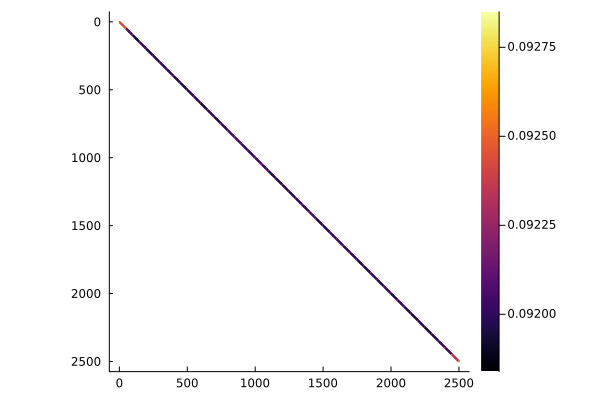

In [92]:
plt1 = spy(omega_kg)
# savefig(plt1,file_name*"sim_kg_"*sub_model_type*"_kgl.pdf")

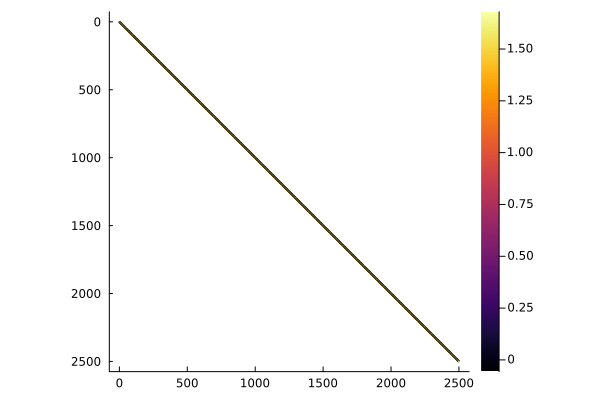

In [93]:
plt2 = spy(omega_wd)
# savefig(plt2,file_name*"sim_kg_"*sub_model_type*"_wtl.pdf")

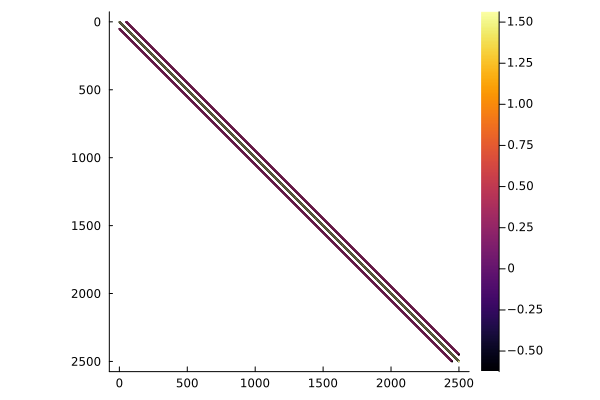

In [94]:
plt3 = spy(omega_gt)
# savefig(plt3,file_name*"sim_kg_"*sub_model_type*"_gt.pdf")

In [ ]:
file_name1= "C:/Users/jaide/Julia scripts/images/sim_kglasso_gt.pdf"
file_name2= "C:/Users/jaide/Julia scripts/images/sim_kglasso_kg.pdf"
file_name3= "C:/Users/jaide/Julia scripts/images/sim_kglasso_wd.pdf"
plot_iid_gt = spy(omega0_iid,size = (1000,1000))
plot_iid_est = spy(omega_iid)
plot_wed_gt = spy(omega0_wed)
plot_wed_est = spy(omega_wed)
# plot(plot_iid_gt,plot_iid_est,plot_wed_est,layout=(1,3), size = (1500,1600), fmt = :pdf)
savefig(plot_iid_gt,file_name1)
savefig(plot_iid_est,file_name2)
savefig(plot_wed_gt,file_name3)

In [ ]:
y = autocor(X[1,2,:], demean= true)
plot(y, line=:stem)


In [102]:
model_type = "ks"
sub_model_type = "unif" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [10, 10, 10]

X_wed, psi0_list = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3, tensorize_out = false) #matrix of dimension d × N
# X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
# compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
for k = 1:K
    for i = 1:N
        copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
        mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    end
end

Ψ_hat_list_tl, _ = teralasso(X_kGram);
# Ψ_hat_list_wd, _ = teralasso(X_kGram,regcoef=[0.5,0.5,0.5]);

(3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463]

In [103]:
model_type = "ks"
sub_model_type = "ar1" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [10, 10, 10]


# X_wed, psi0_list = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3, tensorize_out = false) #matrix of dimension d × N
# # X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
# # compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
# X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
# Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
# for k = 1:K
#     for i = 1:N
#         copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
#         mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
#     end
# end
Ψ_hat_list_wd, _ = teralasso(X_kGram,regcoef=[0.18,0.18,0.18]);

[0.18, 0.18, 0.18]

In [104]:
Omega_tl = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_tl[3]) + kron(I(d_list[1]), Ψ_hat_list_tl[2], I(d_list[3])) + kron(Ψ_hat_list_tl[1], I(d_list[2]), I(d_list[3])));
Omega_gt = sparse(kron(I(d_list[1]), I(d_list[2]), psi0_list[3]) + kron(I(d_list[1]), psi0_list[2], I(d_list[3])) + kron(psi0_list[1], I(d_list[2]), I(d_list[3])));
Omega_wd = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_wd[3]) + kron(I(d_list[1]), Ψ_hat_list_wd[2], I(d_list[3])) + kron(Ψ_hat_list_wd[1], I(d_list[2]), I(d_list[3])));


In [105]:
mcc1 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_tl)
mcc2 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_wd)
print(mcc1,mcc2)

[500.0, 0.0, 1300.0, 497700.0, 0.0010036130068245685, 0.0, 0.7222222222222222, 1.0, 0.8494100250210037][200.0, 0.0, 1300.0, 498000.0, 0.0004014452027298274, 0.0, 0.8666666666666667, 1.0, 0.9307624549212155]

In [70]:
# Omega_tl = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_tl[3]) + kron(I(d_list[1]), Ψ_hat_list_tl[2], I(d_list[3])) + kron(Ψ_hat_list_tl[1], I(d_list[2]), I(d_list[3])));
# Omega_gt = sparse(kron(I(d_list[1]), I(d_list[2]), psi0_list[3]) + kron(I(d_list[1]), psi0_list[2], I(d_list[3])) + kron(psi0_list[1], I(d_list[2]), I(d_list[3])));
# Omega_wd = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_wd[3]) + kron(I(d_list[1]), Ψ_hat_list_wd[2], I(d_list[3])) + kron(Ψ_hat_list_wd[1], I(d_list[2]), I(d_list[3])));


In [147]:
plt1 = spy(Omega_tl)
savefig(plt1,file_name*"sim_tl_"*sub_model_type*"_tl.pdf")

"C:\\Users\\jaide\\Julia scripts\\images\\sim_tl_unif_tl.pdf"

In [148]:
plt2= spy(Omega_gt)
savefig(plt2,file_name*"sim_tl_"*sub_model_type*"_gt.pdf")

"C:\\Users\\jaide\\Julia scripts\\images\\sim_tl_unif_gt.pdf"

In [149]:
plt3 = spy(Omega_wd)
savefig(plt3,file_name*"sim_tl_"*sub_model_type*"_wtl.pdf")

"C:\\Users\\jaide\\Julia scripts\\images\\sim_tl_unif_wtl.pdf"

In [ ]:
plot(plt2,plt1,plt3, size = (1500,1500))

(3,)

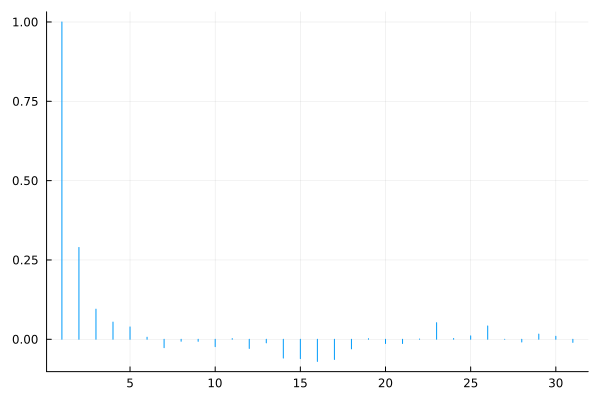

In [10]:
K = 3
N = 1000
d_list = [10, 10, 10]
X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
y = autocor(X_test[1,2,3,:], demean= true)
plot(y, line=:stem, legend = false)

In [157]:
model_type = "sylvester"
sub_model_type = "unif" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [10, 10, 10]

X_wed,psi0_list= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, tensorize_out = false, a_corr = 0.3) #matrix of dimension d × N

# compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
for k = 1:K
    for i = 1:N
        copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
        mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    end
end

# Psi0 = [sparse(eye(d_list[k])) for k = 1:K]
Psi0 = psi0_list
fun = (iter, Psi) -> [1, time()] # NULL func
lambda = [sqrt(d_list[k] * log(prod(d_list)) / N) for k = 1:K] 

Ψ_hat_list, _ = syglasso_palm(X_wed, X_kGram, lambda, Psi0, fun = fun);

(3,)

In [158]:
model_type = "sylvester"
sub_model_type = "unif" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [10, 10, 10]

# X_wed,psi0_list= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, tensorize_out = false, a_corr = 0.2) #matrix of dimension d × N

# compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
for k = 1:K
    for i = 1:N
        copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
        mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    end
end

# Psi0 = [sparse(eye(d_list[k])) for k = 1:K]
Psi0 = psi0_list
fun = (iter, Psi) -> [1, time()] # NULL func
lambda = [sqrt(d_list[k] * log(prod(d_list)) / N) for k = 1:K] 
lambda = lambda*1.2

Ψ_hat_list_wd, _ = syglasso_palm(X_wed, X_kGram, lambda, Psi0, fun = fun);

In [159]:
Omega_syg = kron(I(d_list[3]), I(d_list[2]), Ψ_hat_list[1]) + kron(I(d_list[3]), Ψ_hat_list[2], I(d_list[1])) + kron(Ψ_hat_list[3], I(d_list[2]), I(d_list[1]))
Omega_syg .= Omega_syg * copy(transpose(Omega_syg));

Omega_gt = kron(I(d_list[3]), I(d_list[2]), psi0_list[1]) + kron(I(d_list[3]), psi0_list[2], I(d_list[1])) + kron(psi0_list[3], I(d_list[2]), I(d_list[1]))
Omega_gt .= Omega_gt * copy(transpose(Omega_gt));

Omega_wed = kron(I(d_list[3]), I(d_list[2]), Ψ_hat_list_wd[1]) + kron(I(d_list[3]), Ψ_hat_list_wd[2], I(d_list[1])) + kron(Ψ_hat_list_wd[3], I(d_list[2]), I(d_list[1]))
Omega_wed .= Omega_wed * copy(transpose(Omega_wed));

In [160]:
mcc1 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_syg)
mcc2 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_wed)
print(mcc1,mcc2)

[4880.0, 0.0, 5120.0, 489500.0, 0.009870949472066022, 0.0, 0.512, 1.0, 0.7120014563681047][4100.0, 0.0, 5120.0, 490280.0, 0.008293215744973503, 0.0, 0.5553145336225597, 1.0, 0.7420978307399291]

In [164]:
file_name="C:/Users/jaide/Julia scripts/images/"
plt1 = spy(Omega_syg)
savefig(plt1,file_name*"sim_syg_"*sub_model_type*"_sygl.pdf")

"C:\\Users\\jaide\\Julia scripts\\images\\sim_syg_unif_sygl.pdf"

In [165]:
plt2 = spy(Omega_gt)
savefig(plt2,file_name*"sim_syg_"*sub_model_type*"_gt.pdf")

"C:\\Users\\jaide\\Julia scripts\\images\\sim_syg_unif_gt.pdf"

In [166]:
plt3= spy(Omega_wed)
savefig(plt3,file_name*"sim_syg_"*sub_model_type*"_wtl.pdf")

"C:\\Users\\jaide\\Julia scripts\\images\\sim_syg_unif_wtl.pdf"

In [51]:
Ψ_hat_list_wd

3-element Vector{Matrix{Float64}}:
 [1.1538588408558785 -0.7745386462397145 … 0.0 0.0; -0.7745386462397145 1.1986124598931125 … 0.0 0.0; … ; 0.0 0.0 … 1.1969436323733775 -0.7857929989320006; 0.0 0.0 … -0.7857929989320006 1.155225707497323]
 [1.1527201910523868 -0.7775566284522942 … 0.0 0.0; -0.7775566284522942 1.1929509541051513 … 0.0 0.0; … ; 0.0 0.0 … 1.1751332680568234 -0.7702893710227677; 0.0 0.0 … -0.7702893710227677 1.1328276311389223]
 [1.3055947461266109 -0.7924374213510076 … 0.0 0.0015376821147476257; -0.7924374213510077 1.3335846471302386 … -0.0017039105831355196 0.0; … ; 0.0 -0.0017039105831355196 … 1.3454509633295444 -0.7761617854716352; 0.0015376821147476214 0.0 … -0.7761617854716352 1.2782436551819354]

In [20]:
# AUTOCORRELATION PLOTS
file_name="C:/Users/jaide/Julia scripts/images/"
model_type = "sylvester"
sub_model_type = "unif"


K = 3
N = 1000
d_list = [10, 10, 10]
X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
y = autocor(X_test[1,2,3,:], demean= true)
plt = plot(y, line=:stem, legend = false)

savefig(plt,file_name*"acf_"*model_type*sub_model_type)

(3,)

"C:\\Users\\jaide\\Julia scripts\\images\\acf_sylvesterunif.png"

In [30]:
#Averaging MCC and standard deviations. 


model_type = "ks"
sub_model_type = "unif" #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [10, 10, 10]

X_wed, psi0_list = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3, tensorize_out = false) #matrix of dimension d × N
# X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
# compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
for k = 1:K
    for i = 1:N
        copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
        mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    end
end

Ψ_hat_list_tl, _ = teralasso(X_kGram);

 #this defines the structure of the Kronecker factors, sb = star-block
K = 3
N = 1000
d_list = [10, 10, 10]


# X_wed, psi0_list = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3, tensorize_out = false) #matrix of dimension d × N
# # X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
# # compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
# X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
# Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
# for k = 1:K
#     for i = 1:N
#         copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
#         mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
#     end
# end
Ψ_hat_list_wd, _ = teralasso(X_kGram,regcoef=[0.17,0.17,0.17]);

Omega_tl = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_tl[3]) + kron(I(d_list[1]), Ψ_hat_list_tl[2], I(d_list[3])) + kron(Ψ_hat_list_tl[1], I(d_list[2]), I(d_list[3])));
Omega_gt = sparse(kron(I(d_list[1]), I(d_list[2]), psi0_list[3]) + kron(I(d_list[1]), psi0_list[2], I(d_list[3])) + kron(psi0_list[1], I(d_list[2]), I(d_list[3])));
Omega_wd = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_wd[3]) + kron(I(d_list[1]), Ψ_hat_list_wd[2], I(d_list[3])) + kron(Ψ_hat_list_wd[1], I(d_list[2]), I(d_list[3])));

mcc1 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_tl)
mcc2 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_wd)
print(mcc1[-1],mcc2[-1])

(3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.17, 0.17, 0.17]

LoadError: BoundsError: attempt to access 9-element Vector{Float64} at index [-1]

In [131]:
mcc_wed = []
mcc_tl = []

for i in 1:100
    model_type = "ks"
    sub_model_type = "ar1" #this defines the structure of the Kronecker factors, sb = star-block
    K = 3
    N = 1000
    d_list = [10, 10, 10]
    
    X_wed, psi0_list = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3, tensorize_out = false) #matrix of dimension d × N
    # X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
    # compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
    X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
    Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
    for k = 1:K
        for i = 1:N
            copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
            mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
        end
    end
    
    Ψ_hat_list_tl, _ = teralasso(X_kGram);
    
     #this defines the structure of the Kronecker factors, sb = star-block
    K = 3
    N = 1000
    d_list = [10, 10, 10]
    
    
    # X_wed, psi0_list = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3, tensorize_out = false) #matrix of dimension d × N
    # # X_test, _ = TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, a_corr= 0.3)
    # # compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
    # X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
    # Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
    # for k = 1:K
    #     for i = 1:N
    #         copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
    #         mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
    #     end
    # end
    Ψ_hat_list_wd, _ = teralasso(X_kGram,regcoef=[0.177,0.177,0.177]);
    
    Omega_tl = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_tl[3]) + kron(I(d_list[1]), Ψ_hat_list_tl[2], I(d_list[3])) + kron(Ψ_hat_list_tl[1], I(d_list[2]), I(d_list[3])));
    Omega_gt = sparse(kron(I(d_list[1]), I(d_list[2]), psi0_list[3]) + kron(I(d_list[1]), psi0_list[2], I(d_list[3])) + kron(psi0_list[1], I(d_list[2]), I(d_list[3])));
    Omega_wd = sparse(kron(I(d_list[1]), I(d_list[2]), Ψ_hat_list_wd[3]) + kron(I(d_list[1]), Ψ_hat_list_wd[2], I(d_list[3])) + kron(Ψ_hat_list_wd[1], I(d_list[2]), I(d_list[3])));
    
    mcc1 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_tl)
    mcc2 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_wd)

    push!(mcc_tl,last(mcc1))
    push!(mcc_wed,last(mcc2))
    
end

(3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.15174271293851463, 0.15174271293851463][0.177, 0.177, 0.177](3,)[0.15174271293851463, 0.1517

In [132]:
print("Mean and sd of MCC for Teralasso : ",mean(mcc_tl)," ± ", var(mcc_tl)^0.5)


Mean and sd of MCC for Teralasso : 0.4923206626988392 ± 0.010318171185553057

In [133]:
print("Mean and sd of MCC for WedTLASSO : ",mean(mcc_wed)," ± ", var(mcc_wed)^0.5)

Mean and sd of MCC for WedTLASSO : 0.5127485664849778 ± 0.010372273320956225

In [43]:
# Simulation SYGLASSO
mcc_wed = []
mcc_syg = []

 mcc_wed = []
mcc_tl = []
  for i in 1:35
        
    model_type = "sylvester"
    sub_model_type = "ar1" #this defines the structure of the Kronecker factors, sb = star-block
    K = 3
    N = 1000
    d_list = [10, 10, 10]
    
    X_wed,psi0_list= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, tensorize_out = false, a_corr = 0.3) #matrix of dimension d × N
    
    # compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
    X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
    Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
    for k = 1:K
        for i = 1:N
            copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
            mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
        end
    end
    
    # Psi0 = [sparse(eye(d_list[k])) for k = 1:K]
    Psi0 = psi0_list
    fun = (iter, Psi) -> [1, time()] # NULL func
    lambda = [sqrt(d_list[k] * log(prod(d_list)) / N) for k = 1:K] 
    
    Ψ_hat_list, _ = syglasso_palm(X_wed, X_kGram, lambda, Psi0, fun = fun);
     #this defines the structure of the Kronecker factors, sb = star-block
    K = 3
    N = 1000
    d_list = [10, 10, 10]
    
    # X_wed,psi0_list= TensorGraphicalModels.gen_kronecker_data_wd(model_type, sub_model_type, K, N, d_list, tensorize_out = false, a_corr = 0.2) #matrix of dimension d × N
    
    # compute the mode-k Gram matrices (the sufficient statistics for TeraLasso)
    X_kGram = [zeros(d_list[k], d_list[k]) for k = 1:K]
    Xk = [zeros(d_list[k], Int(prod(d_list) / d_list[k])) for k = 1:K]
    for k = 1:K
        for i = 1:N
            copy!(Xk[k], tenmat(reshape(X_wed[:, i], Tuple(d_list)), k))
            mul!(X_kGram[k], Xk[k], copy(transpose(Xk[k])), 1.0 / N, 1.0)
        end
    end
    
    # Psi0 = [sparse(eye(d_list[k])) for k = 1:K]
    Psi0 = psi0_list
    fun = (iter, Psi) -> [1, time()] # NULL func
    lambda = [sqrt(d_list[k] * log(prod(d_list)) / N) for k = 1:K] 
    lambda = lambda*1.3
    
    Ψ_hat_list_wd, _ = syglasso_palm(X_wed, X_kGram, lambda, Psi0, fun = fun);

    Omega_syg = kron(I(d_list[3]), I(d_list[2]), Ψ_hat_list[1]) + kron(I(d_list[3]), Ψ_hat_list[2], I(d_list[1])) + kron(Ψ_hat_list[3], I(d_list[2]), I(d_list[1]))
    Omega_syg .= Omega_syg * copy(transpose(Omega_syg));
    
    Omega_gt = kron(I(d_list[3]), I(d_list[2]), psi0_list[1]) + kron(I(d_list[3]), psi0_list[2], I(d_list[1])) + kron(psi0_list[3], I(d_list[2]), I(d_list[1]))
    Omega_gt .= Omega_gt * copy(transpose(Omega_gt));
    
    Omega_wed = kron(I(d_list[3]), I(d_list[2]), Ψ_hat_list_wd[1]) + kron(I(d_list[3]), Ψ_hat_list_wd[2], I(d_list[1])) + kron(Ψ_hat_list_wd[3], I(d_list[2]), I(d_list[1]))
    Omega_wed .= Omega_wed * copy(transpose(Omega_wed));
    
    mcc1 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_syg)
    mcc2 = TensorGraphicalModels.metric_edge(Omega_gt,Omega_wed)

    push!(mcc_syg, last(mcc1))
    push!(mcc_wed, last(mcc2))
end

(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)(3,)

In [44]:
mcc_wed = filter(!isnan, mcc_wed)

mcc_syg = filter(!isnan, mcc_syg)



21-element Vector{Any}:
 0.458708769759969
 0.4400053834019213
 0.41488391004609954
 0.5080186320628202
 0.46298750416008966
 0.45768375158104363
 0.4799335645238971
 0.42475611009683817
 0.44552013065831314
 0.42280693380957535
 0.4343687628707133
 0.4600849599119187
 0.47410292155860273
 0.44185816644860043
 0.44373155036592593
 0.42207046847548174
 0.4546446838441939
 0.42910849139795615
 0.434269818974711
 0.45111098422022783
 0.45893737775056503

In [45]:
print("Mean and sd of MCC for Teralasso : ",mean(mcc_syg)," ± ", var(mcc_syg)^0.5)

Mean and sd of MCC for Teralasso : 0.4485520417104506 ± 0.022193174799224186

In [46]:
print("Mean and sd of MCC for WedTLASSO : ",mean(mcc_wed)," ± ", var(mcc_wed)^0.5)

Mean and sd of MCC for WedTLASSO : 0.49031484768905587 ± 0.021941543931312375